In [1]:
using DataFrames
using Gadfly
using Compose
set_default_plot_size(30cm, 12cm)

# 1AEL

## minimization

In [2]:
dir_ael_min="/home/german/labo/18/lbp/run/1ael/mhe/m"
ael_min_Etot = readdlm("$dir_ael_min/outputs/Etot_min");
ael_mmin_Etot = readdlm("$dir_ael_min/outputs/Etot_mmin");
df_ael_MIN_Etot = DataFrame(E=[ael_min_Etot[:, 2]; ael_mmin_Etot[:, 2]],
NSTEP=[ael_min_Etot[:, 1]; (ael_mmin_Etot[:, 1] .+ 500)]);

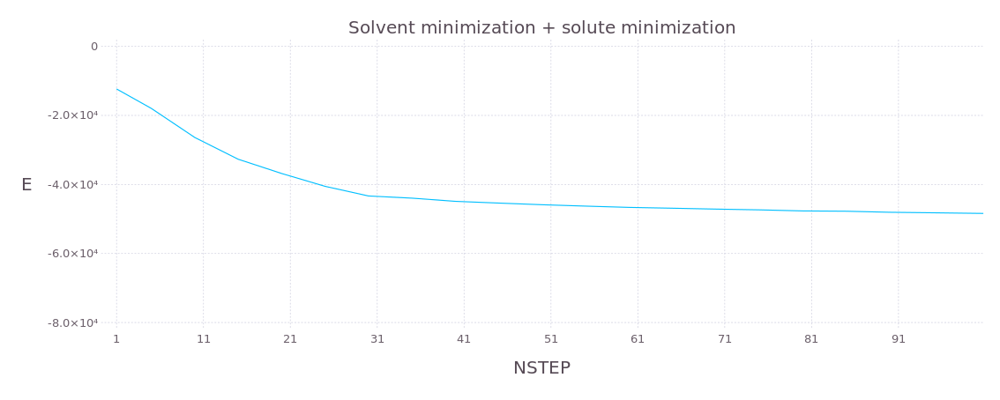

In [3]:
plot(df_ael_MIN_Etot, Geom.line, x="NSTEP", y="E",
Coord.Cartesian(xmin=0, xmax=100),
Guide.title("Solvent minimization + solute minimization"),
Guide.xticks(ticks = collect(1:10:100)),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt, key_title_font_size = 30pt))

## heat

In [4]:
# Energies
dir_ael_hea="/home/german/labo/18/lbp/run/1ael/mhe/h"
ael_hea_Ek = readdlm("$dir_ael_hea/outputs/ektot.dat");
ael_hea_Ep = readdlm("$dir_ael_hea/outputs/eptot.dat");
ael_hea_Etot = readdlm("$dir_ael_hea/outputs/etot.dat");

df_ael_HEA_E = DataFrame(E=[ael_hea_Ek[:, 2]; ael_hea_Ep[:, 2]; ael_hea_Etot[:, 2]],
NSTEP=[ael_hea_Ek[:, 1]; ael_hea_Ep[:, 1]; ael_hea_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(ael_hea_Ek[:, 1])]));

# Temperature
ael_hea_T = readdlm("$dir_ael_hea/outputs/temp.dat");
df_ael_HEA_T = DataFrame(Temperature=ael_hea_T[:, 2],
NSTEP=ael_hea_T[:, 1]);

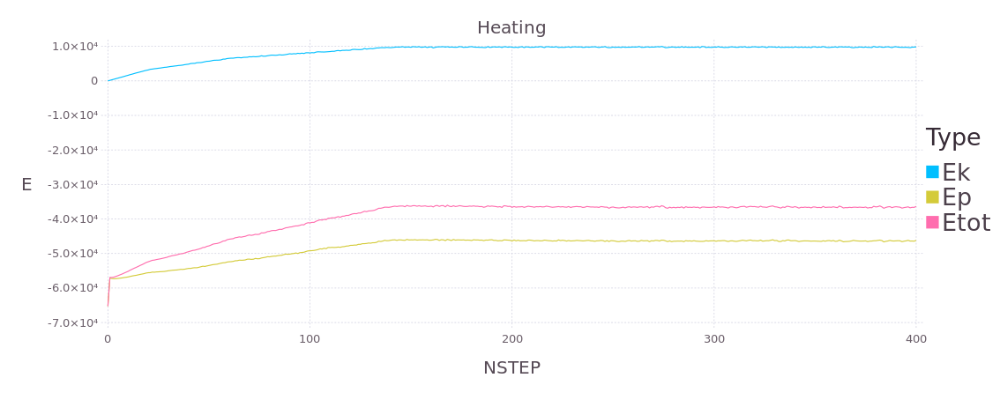

In [5]:
plot(df_ael_HEA_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Heating"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

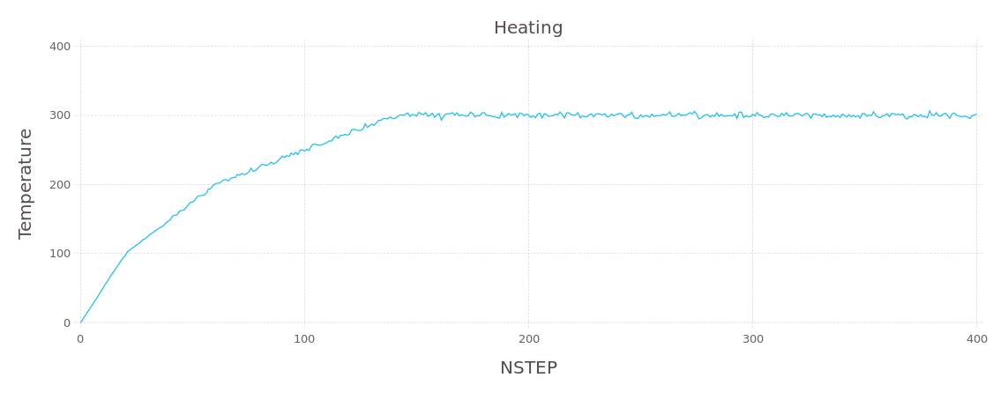

In [6]:
plot(df_ael_HEA_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Heating"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

## equilibration

In [7]:
# Energies
dir_ael_equ="/home/german/labo/18/lbp/run/1ael/mhe/e"
ael_equ_Ek = readdlm("$dir_ael_equ/outputs/ektot.dat");
ael_equ_Ep = readdlm("$dir_ael_equ/outputs/eptot.dat");
ael_equ_Etot = readdlm("$dir_ael_equ/outputs/etot.dat");

df_ael_EQU_E = DataFrame(E=[ael_equ_Ek[:, 2]; ael_equ_Ep[:, 2]; ael_equ_Etot[:, 2]],
NSTEP=[ael_equ_Ek[:, 1]; ael_equ_Ep[:, 1]; ael_equ_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(ael_equ_Ek[:, 1])]));

# Temperature
ael_equ_T = readdlm("$dir_ael_equ/outputs/temp.dat");
df_ael_EQU_T = DataFrame(Temperature=ael_equ_T[:, 2],
NSTEP=ael_equ_T[:, 1]);

# RMSD ntwx=500
ael_equ_rmsd = readdlm("$dir_ael_equ/rmsd_equ_1ael");
df_ael_EQU_RMSD = DataFrame(RMSD=ael_equ_rmsd[:, 2], Frame=ael_equ_rmsd[:, 1]);

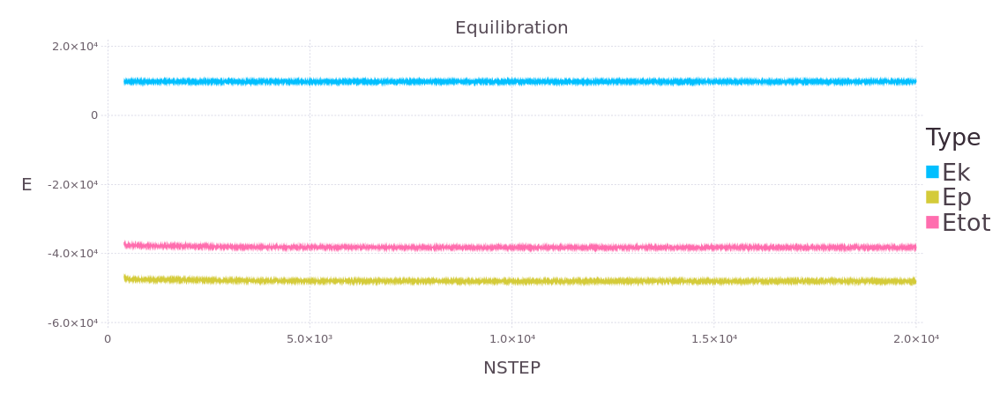

In [8]:
plot(df_ael_EQU_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Equilibration"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

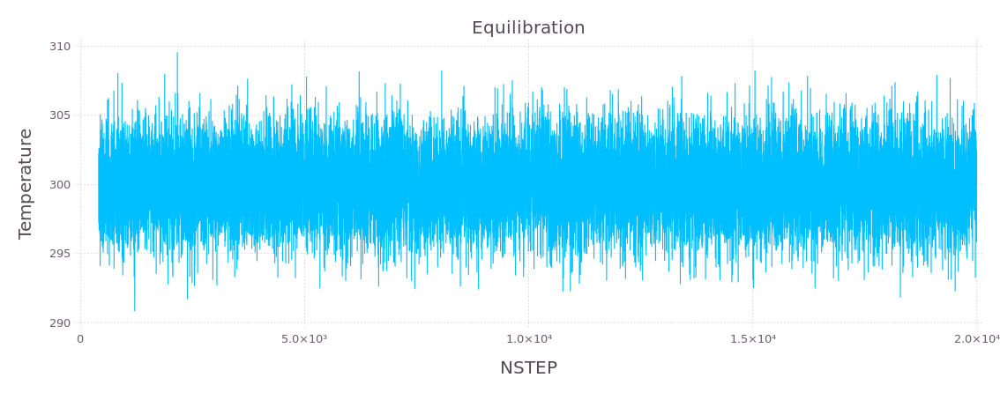

In [9]:
plot(df_ael_EQU_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Equilibration"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

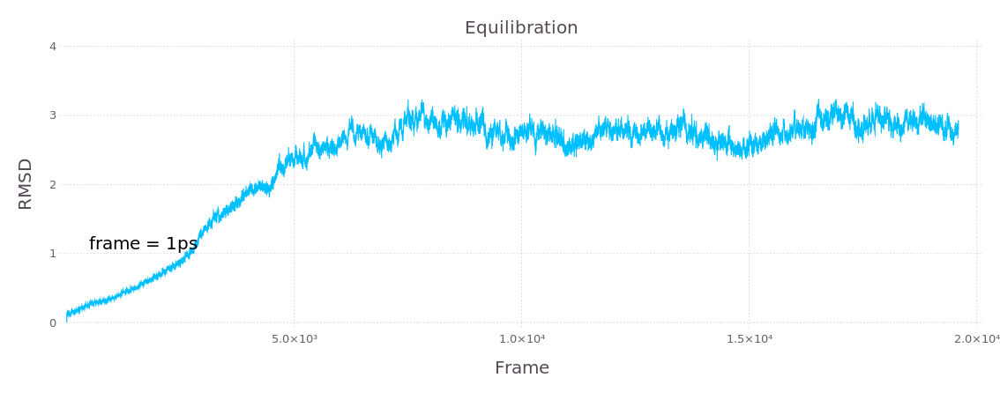

In [18]:
# Escribo c/ 1ps
plot(df_ael_EQU_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Equilibration"),
Guide.annotation(compose(compose(context(), text(500, 1.0, "frame = 1ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

### production

In [11]:
# Energies
dir_ael_pdt = "/home/german/labo/18/lbp/run/1ael"
ael_pdt_Ek = readdlm("$dir_ael_pdt/data/outputs/ektot.dat");
ael_pdt_Ep = readdlm("$dir_ael_pdt/data/outputs/eptot.dat");
ael_pdt_Etot = readdlm("$dir_ael_pdt/data/outputs/etot.dat");
df_ael_PDT_E = DataFrame(E=[ael_pdt_Ek[:, 2]; ael_pdt_Ep[:, 2]; ael_pdt_Etot[:, 2]],
NSTEP=[ael_pdt_Ek[:, 1]; ael_pdt_Ep[:, 1]; ael_pdt_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(ael_pdt_Ek[:, 1])]));

# Temperature
ael_pdt_T = readdlm("$dir_ael_pdt/data/outputs/temp.dat");
df_ael_PDT_T = DataFrame(Temperature=ael_pdt_T[:, 2],
NSTEP=ael_pdt_T[:, 1]);

# RMSD 
ael_pdt_rmsd = readdlm("$dir_ael_pdt/data/rmsd_1ael");
df_ael_PDT_RMSD = DataFrame(RMSD=ael_pdt_rmsd[:, 2], Frame=ael_pdt_rmsd[:, 1]);

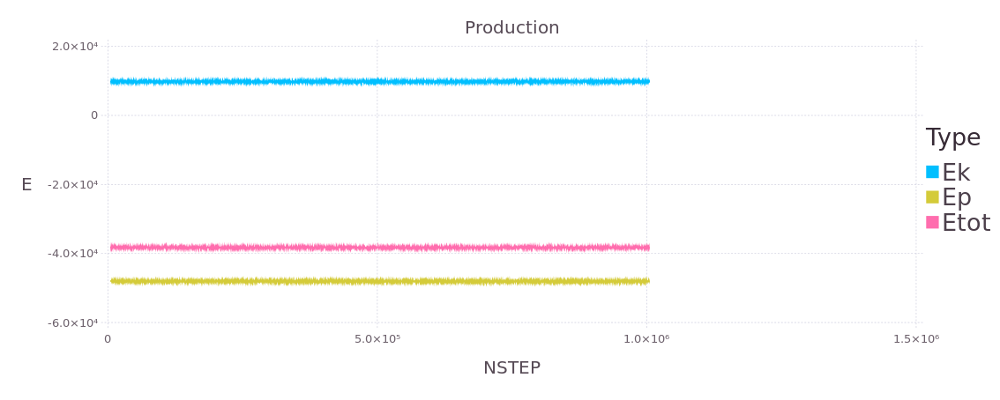

In [12]:
plot(df_ael_PDT_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))                                                        

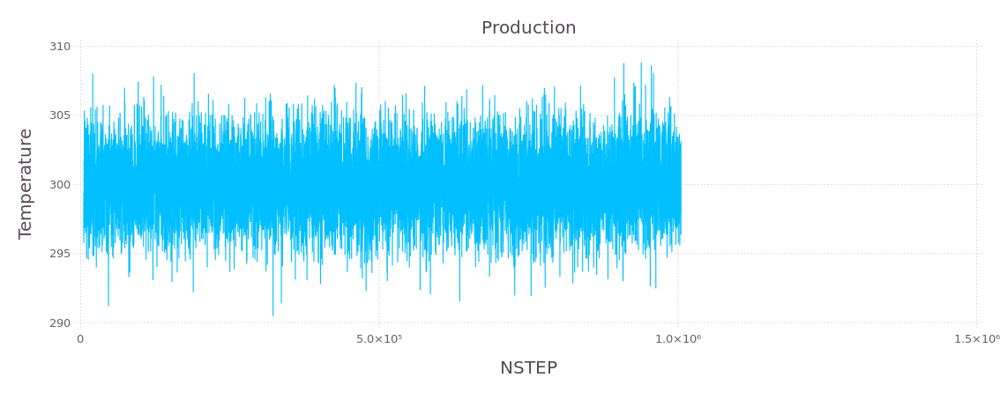

In [13]:
plot(df_ael_PDT_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

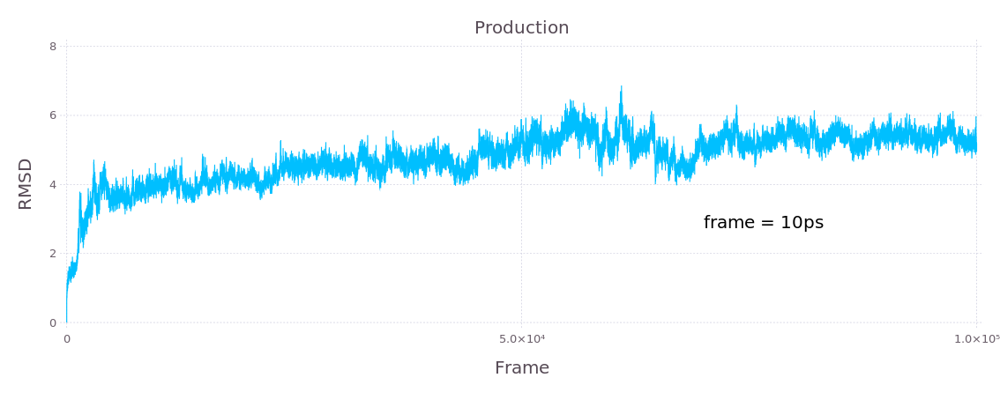

In [14]:
pdf_ael_PDT_RMSD = plot(df_ael_PDT_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Production"),
Guide.annotation(compose(compose(context(), text(70000, 2.6, "frame = 10ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

# 1URE

## minimization

In [15]:
dir_ure_min="/home/german/labo/18/lbp/run/1ure/mhe/m"
ure_min_Etot = readdlm("$dir_ure_min/outputs/Etot_min");
ure_mmin_Etot = readdlm("$dir_ure_min/outputs/Etot_mmin");
df_ure_MIN_Etot = DataFrame(E=[ure_min_Etot[:, 2]; ure_mmin_Etot[:, 2]],
NSTEP=[ure_min_Etot[:, 1]; (ure_mmin_Etot[:, 1] .+ 500)]);

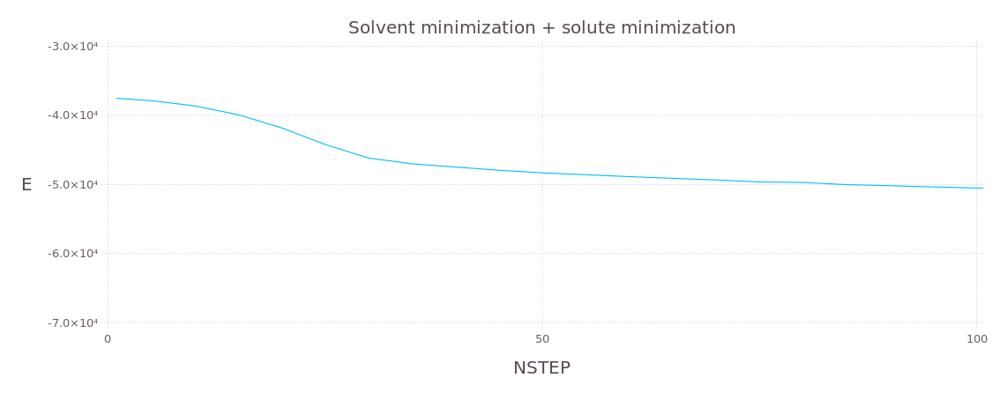

In [16]:
plot(df_ure_MIN_Etot, Geom.line, x="NSTEP", y="E",
Coord.Cartesian(xmin=0, xmax=100),
Guide.title("Solvent minimization + solute minimization"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt, key_title_font_size = 30pt))

## heat

In [17]:
# Energies
dir_ure_hea="/home/german/labo/18/lbp/run/1ure/mhe/h"
ure_hea_Ek = readdlm("$dir_ure_hea/outputs/ektot.dat");
ure_hea_Ep = readdlm("$dir_ure_hea/outputs/eptot.dat");
ure_hea_Etot = readdlm("$dir_ure_hea/outputs/etot.dat");

df_ure_HEA_E = DataFrame(E=[ure_hea_Ek[:, 2]; ure_hea_Ep[:, 2]; ure_hea_Etot[:, 2]],
NSTEP=[ure_hea_Ek[:, 1]; ure_hea_Ep[:, 1]; ure_hea_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(ure_hea_Ek[:, 1])]));

# Temperature
ure_hea_T = readdlm("$dir_ure_hea/outputs/temp.dat");
df_ure_HEA_T = DataFrame(Temperature=ure_hea_T[:, 2],
NSTEP=ure_hea_T[:, 1]);

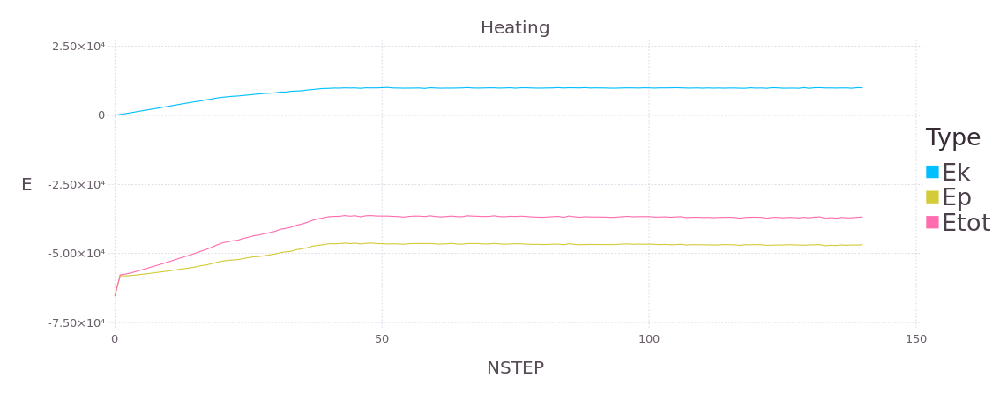

In [18]:
plot(df_ure_HEA_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Heating"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

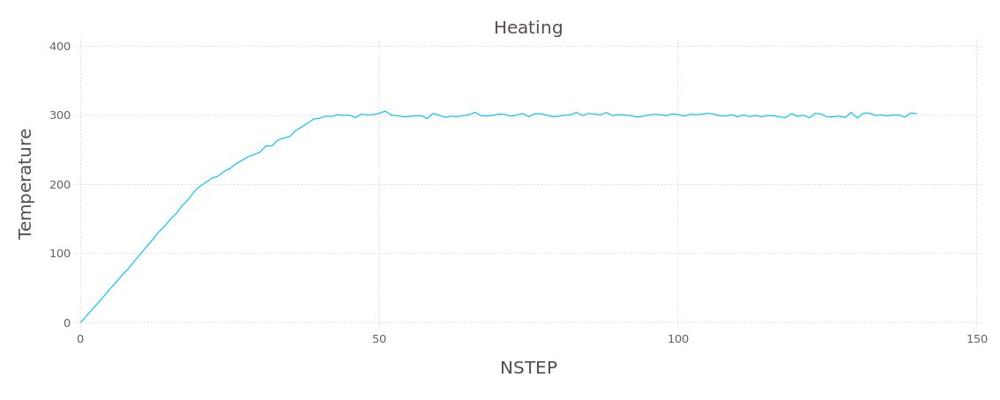

In [19]:
plot(df_ure_HEA_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Heating"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

## equilibration

In [20]:
# Energies
dir_ure_equ="/home/german/labo/18/lbp/run/1ure/mhe/e"
ure_equ_Ek = readdlm("$dir_ure_equ/outputs/ektot.dat");
ure_equ_Ep = readdlm("$dir_ure_equ/outputs/eptot.dat");
ure_equ_Etot = readdlm("$dir_ure_equ/outputs/etot.dat");

df_ure_EQU_E = DataFrame(E=[ure_equ_Ek[:, 2]; ure_equ_Ep[:, 2]; ure_equ_Etot[:, 2]],
NSTEP=[ure_equ_Ek[:, 1]; ure_equ_Ep[:, 1]; ure_equ_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(ure_equ_Ek[:, 1])]));

# Temperature
ure_equ_T = readdlm("$dir_ure_equ/outputs/temp.dat");
df_ure_EQU_T = DataFrame(Temperature=ure_equ_T[:, 2],
NSTEP=ure_equ_T[:, 1]);

# RMSD ntwx=500
ure_equ_rmsd = readdlm("$dir_ure_equ/rmsd_equ_1ure");
df_ure_EQU_RMSD = DataFrame(RMSD=ure_equ_rmsd[:, 2], Frame=ure_equ_rmsd[:, 1]);

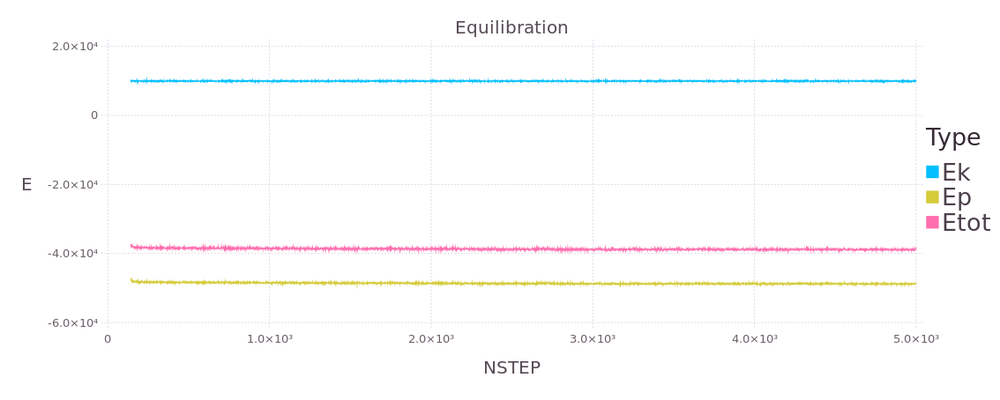

In [21]:
plot(df_ure_EQU_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Equilibration"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

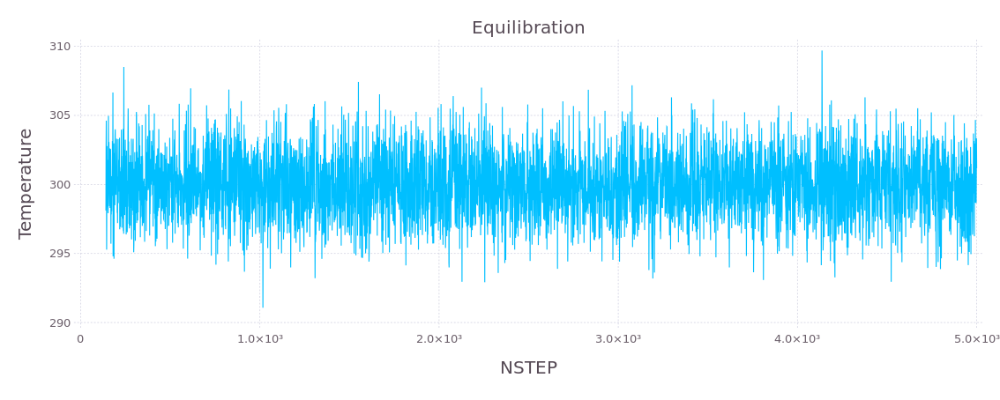

In [22]:
plot(df_ure_EQU_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Equilibration"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

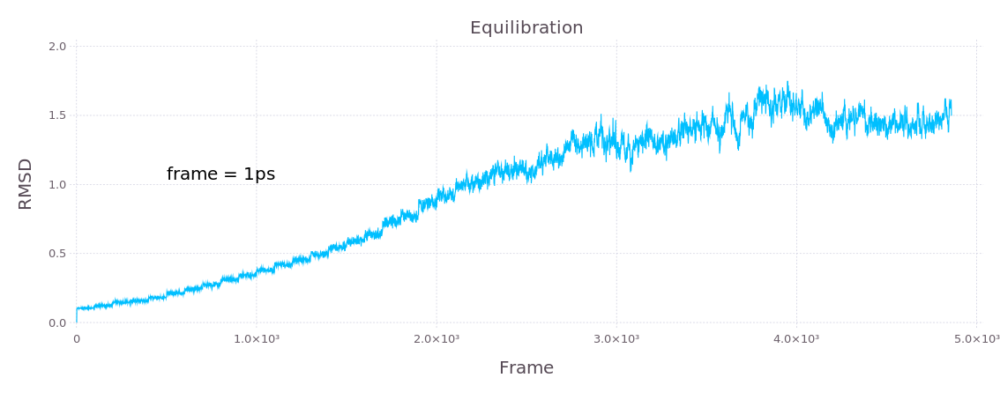

In [23]:
# Escribo c/ 1ps
plot(df_ure_EQU_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Equilibration"),
Guide.annotation(compose(compose(context(), text(500, 1.0, "frame = 1ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

### production

In [24]:
# Energies
dir_ure_pdt = "/home/german/labo/18/lbp/run/1ure"
ure_pdt_Ek = readdlm("$dir_ure_pdt/data/outputs/ektot.dat");
ure_pdt_Ep = readdlm("$dir_ure_pdt/data/outputs/eptot.dat");
ure_pdt_Etot = readdlm("$dir_ure_pdt/data/outputs/etot.dat");
df_ure_PDT_E = DataFrame(E=[ure_pdt_Ek[:, 2]; ure_pdt_Ep[:, 2]; ure_pdt_Etot[:, 2]],
NSTEP=[ure_pdt_Ek[:, 1]; ure_pdt_Ep[:, 1]; ure_pdt_Etot[:, 1]];
Type=repeat(["Ek"; "Ep"; "Etot"], inner=[length(ure_pdt_Ek[:, 1])]));

# Temperature
ure_pdt_T = readdlm("$dir_ure_pdt/data/outputs/temp.dat");
df_ure_PDT_T = DataFrame(Temperature=ure_pdt_T[:, 2],
NSTEP=ure_pdt_T[:, 1]);

# RMSD 
ure_pdt_rmsd = readdlm("$dir_ure_pdt/data/rmsd_1ure");
df_ure_PDT_RMSD = DataFrame(RMSD=ure_pdt_rmsd[:, 2], Frame=ure_pdt_rmsd[:, 1]);

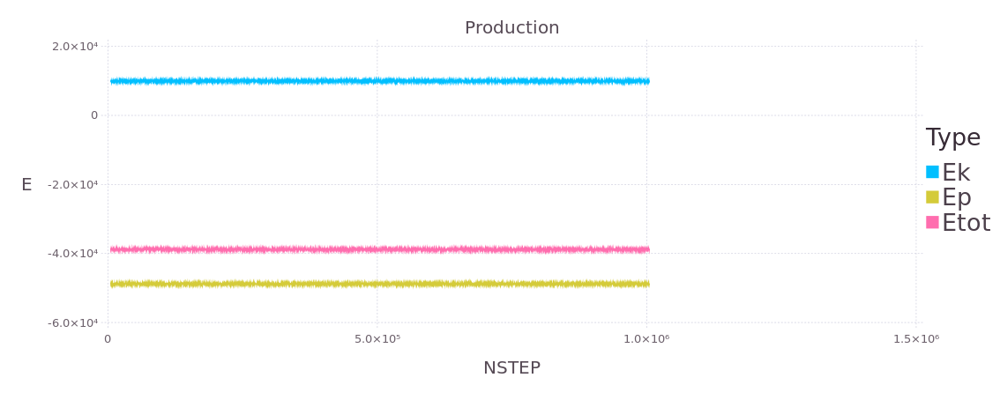

In [25]:
plot(df_ure_PDT_E, Geom.line, x="NSTEP", y="E", color="Type",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))                                                        

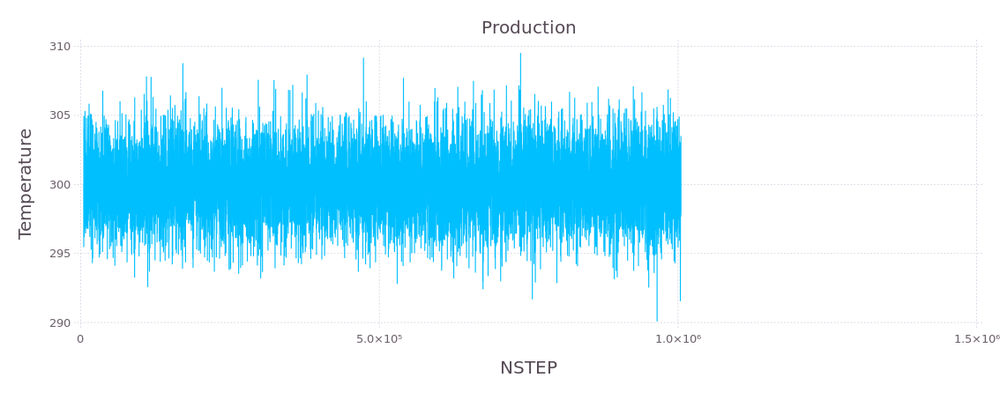

In [26]:
plot(df_ure_PDT_T, Geom.line, x="NSTEP", y="Temperature",
Guide.title("Production"),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))

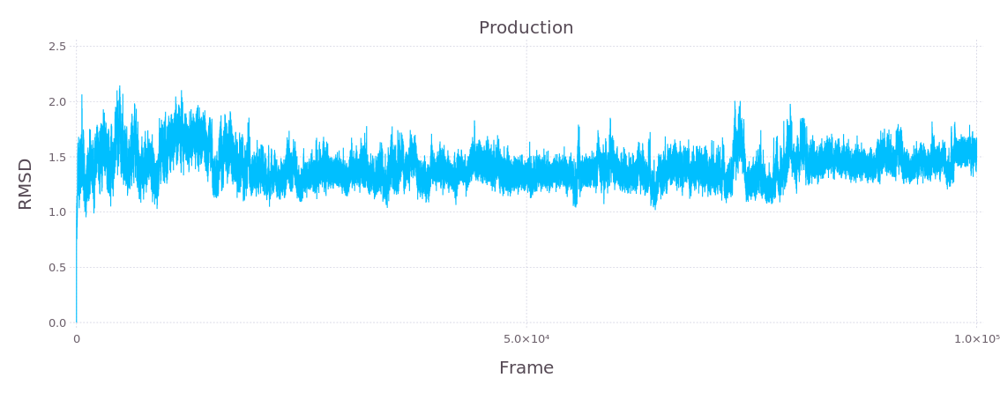

In [27]:
pdf_ure_PDT_RMSD = plot(df_ure_PDT_RMSD, Geom.line, x="Frame", y="RMSD",
Guide.title("Production"),
Guide.annotation(compose(compose(context(), text(70000, 2.6, "frame = 10ps")), fontsize(15pt), fill("black"))),
Theme(minor_label_font_size = 10pt, major_label_font_size = 15pt,
key_title_font_size=20pt, key_label_font_size=20pt))